# Explore data augmentations

This notebook will be used to test different data augmentation strategies. In your config file, you can modify the augmentations by adding `data_augmentation_options`. For example, I would like to add a random RGB to gray transform with a probability of 0.2:
```
data_augmentation_options {
    random_rgb_to_gray {
    probability: 0.2
    }
```

A complete list of augmentation is provided the [`preprocessor.proto` file of the Tf Object Detection API](https://github.com/tensorflow/models/blob/master/research/object_detection/protos/preprocessor.proto).

### Helper functions

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle

In [10]:
%matplotlib inline

In [3]:
def recenter_image(image):
    # ssd preprocessing
    image += [123.68, 116.779, 103.939]
    return image

def display_instances(image, bboxes, classes):
    image = recenter_image(image)
    w, h, _ = image.shape
    # resize the bboxes
    bboxes[:, [0, 2]] *= w
    bboxes[:, [1, 3]] *= h
    
    f, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(image.astype(np.uint8))
    for bb, cl in zip(bboxes, classes):
        y1, x1, y2, x2 = bb
        rec = Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor='r', linewidth=2)
        ax.add_patch(rec)
    plt.show()

def display_batch(batch):
    # get images, bboxes and classes
    batched_images = batch[0]['image'].numpy()
    batched_bboxes = batch[1]['groundtruth_boxes'].numpy()
    batched_classes = batch[1]['groundtruth_classes'].numpy()
    num_bboxes = batch[1]['num_groundtruth_boxes'].numpy()
    batch_size = batched_images.shape[0]
    for idx in range(batch_size):
        display_instances(batched_images[idx, ...], 
                          batched_bboxes[idx, :num_bboxes[idx], :],
                          batched_classes[idx, ...])

### Display augmentations

In [4]:
from object_detection.inputs import train_input
from object_detection.utils.config_util import get_configs_from_pipeline_file

In [5]:
def get_train_input(config_path):
  """
  Get the tf dataset that inputs training batches
  args:
    - config_path [str]: path to the edited config file
  returns:
    - dataset [tf.Dataset]: data outputting augmented batches
  """
  # parse config
  configs = get_configs_from_pipeline_file(config_path)
  train_config = configs['train_config']
  train_input_config = configs['train_input_config']

  # get the dataset
  dataset = train_input(train_config, train_input_config, configs['model'])
  return dataset

## Reference image augmentation pipeline

In [11]:
train_dataset = get_train_input("experiments/reference/pipeline_new.config")

INFO:tensorflow:Reading unweighted datasets: ['/waymo/splitted/train/segment-11928449532664718059_1200_000_1220_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10212406498497081993_5300_000_5320_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-11113047206980595400_2560_000_2580_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-11839652018869852123_2565_000_2585_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-11070802577416161387_740_000_760_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10444454289801298640_4360_000_4380_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10061305430875486848_1080_000_1100_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10455472356147194054_1560_000_1580_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10226164909075980558_180_000_200_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10075870402459732738_1060_0

INFO:tensorflow:Number of filenames to read: 80


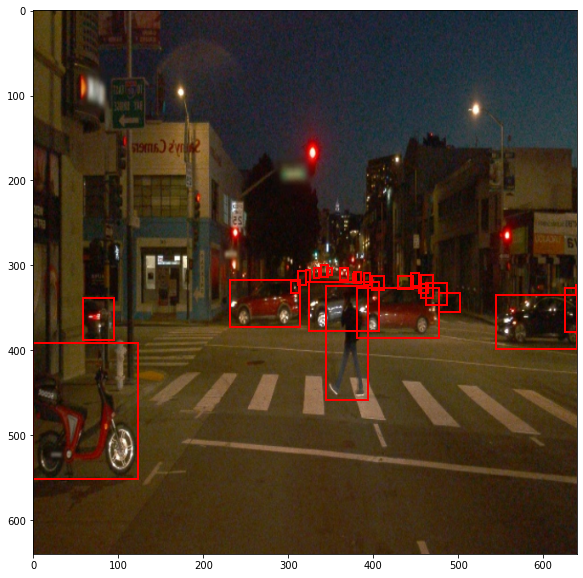

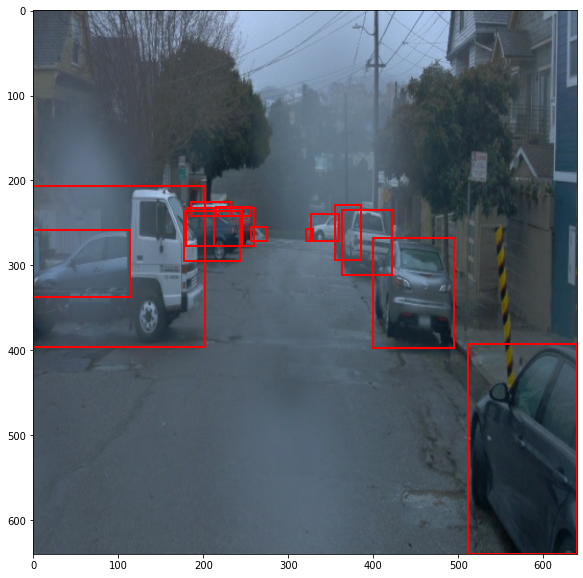

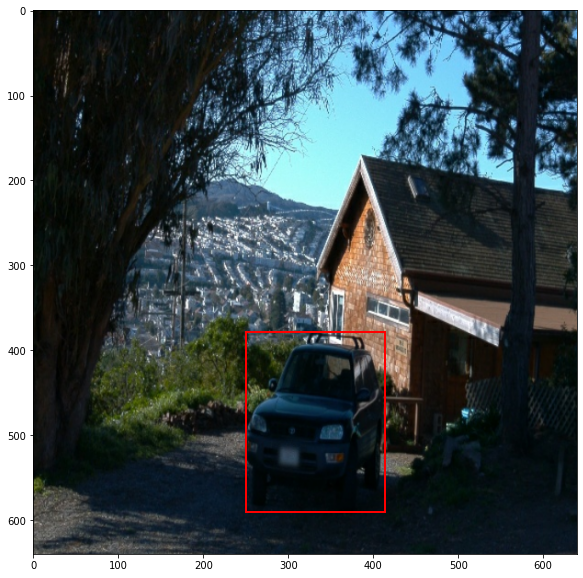

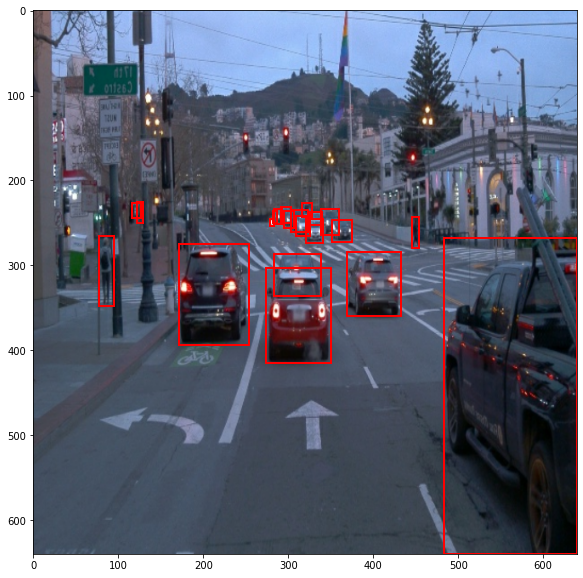

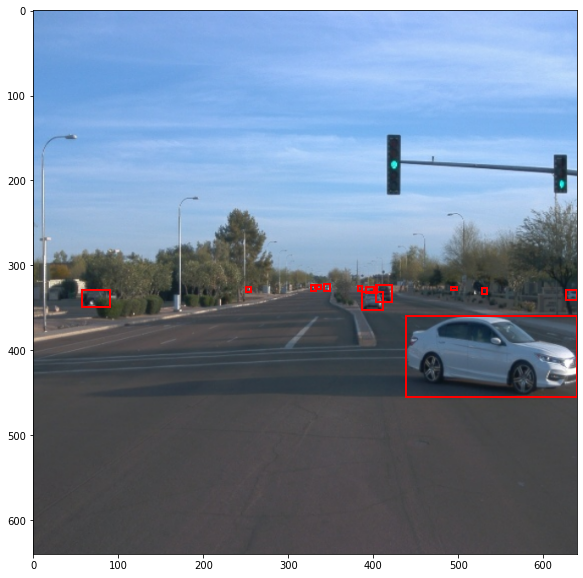

...

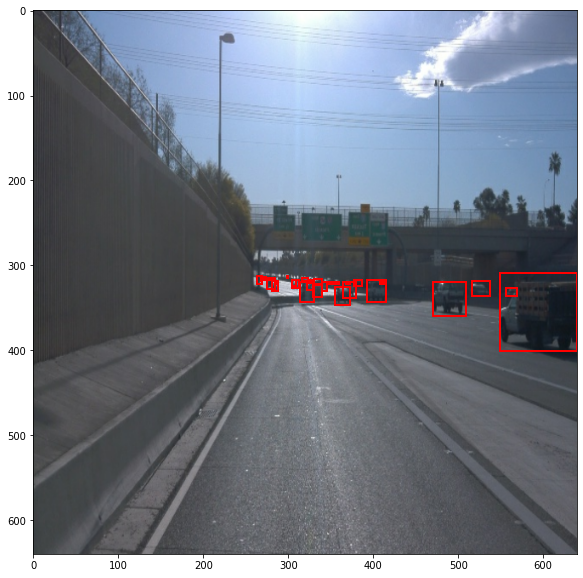

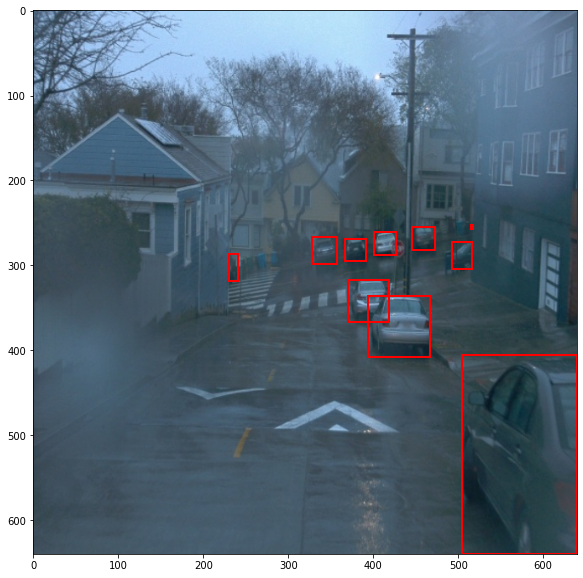

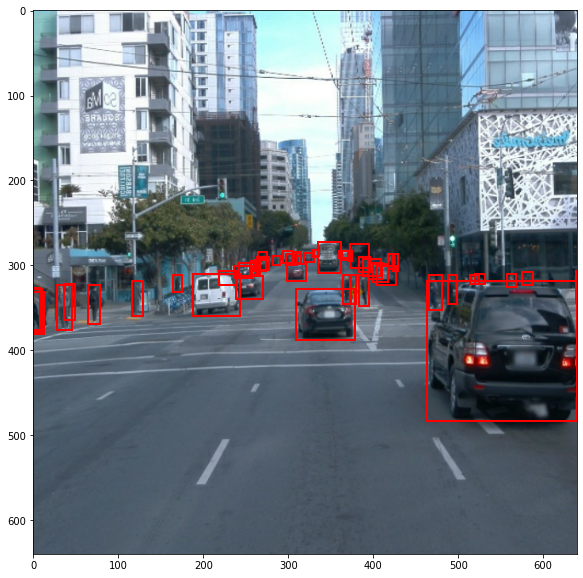

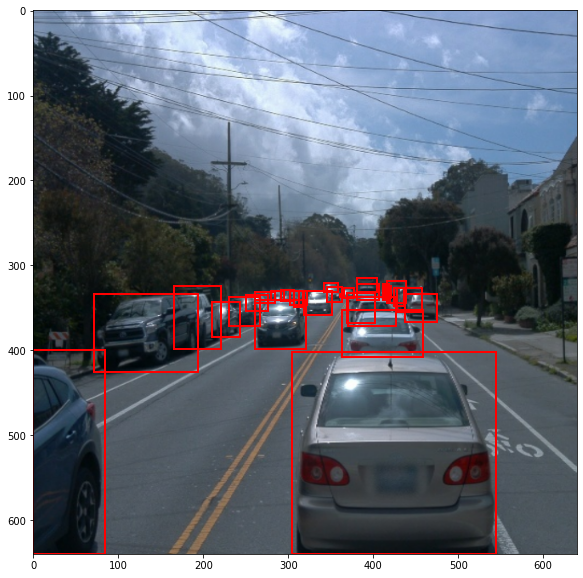

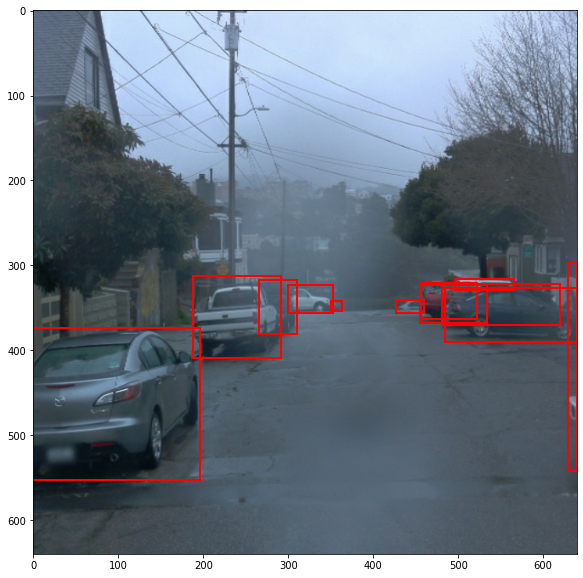

In [12]:
for batch in train_dataset.take(10):
    display_batch(batch)

## Test 2 image augmentation pipeline

In [19]:
train_dataset = get_train_input("experiments/test2/pipeline_new.config")

INFO:tensorflow:Reading unweighted datasets: ['/waymo/splitted/train/segment-11928449532664718059_1200_000_1220_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10212406498497081993_5300_000_5320_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-11113047206980595400_2560_000_2580_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-11839652018869852123_2565_000_2585_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-11070802577416161387_740_000_760_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10444454289801298640_4360_000_4380_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10061305430875486848_1080_000_1100_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10455472356147194054_1560_000_1580_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10226164909075980558_180_000_200_000_with_camera_labels.tfrecord', '/waymo/splitted/train/segment-10075870402459732738_1060_0

INFO:tensorflow:Number of filenames to read: 80


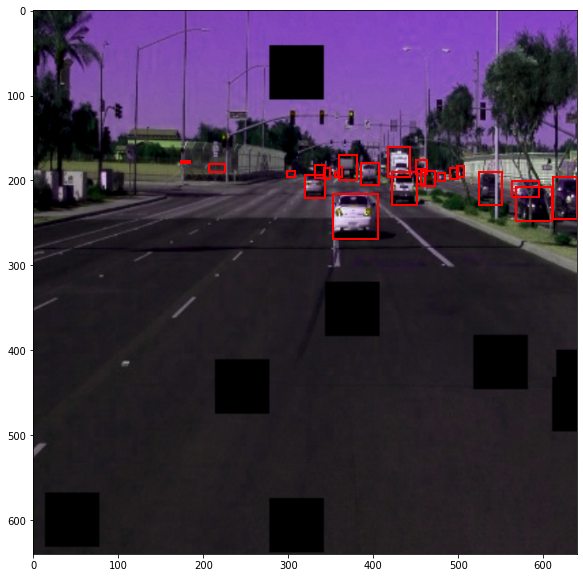

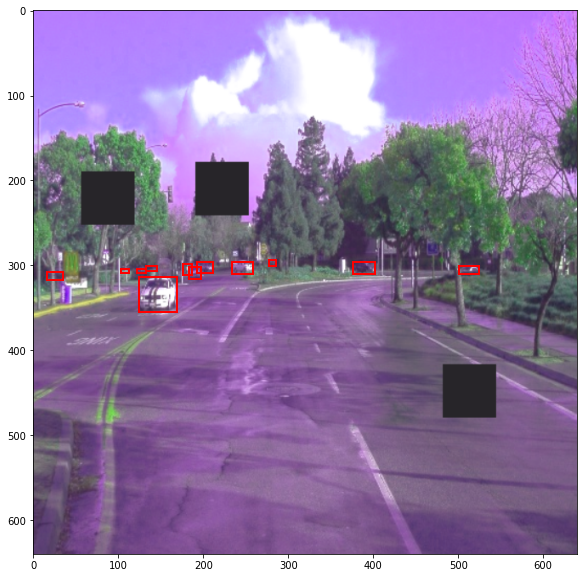

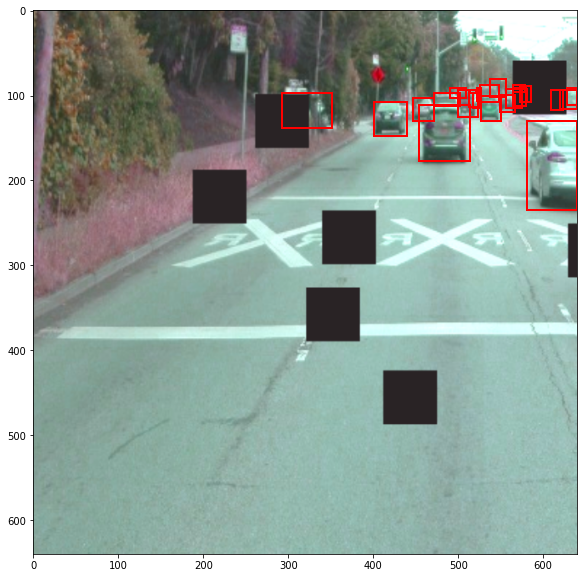

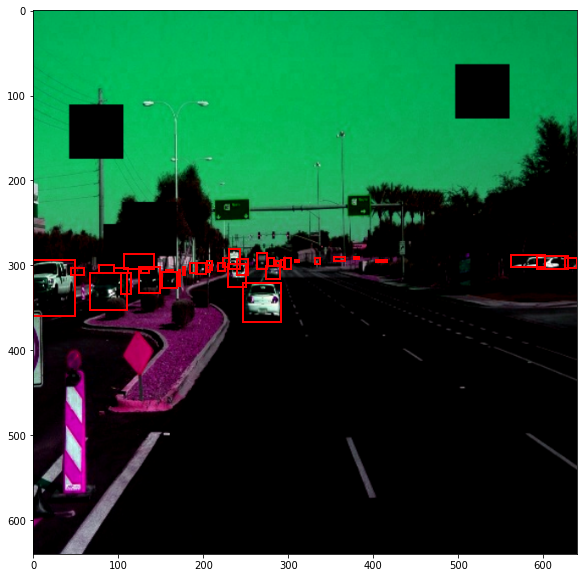

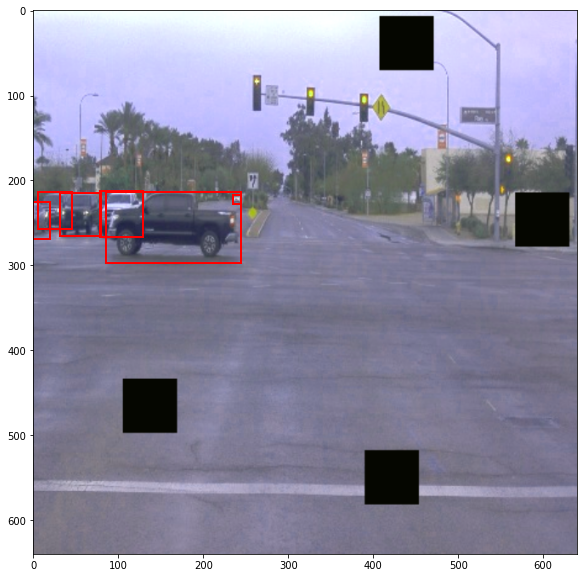

...

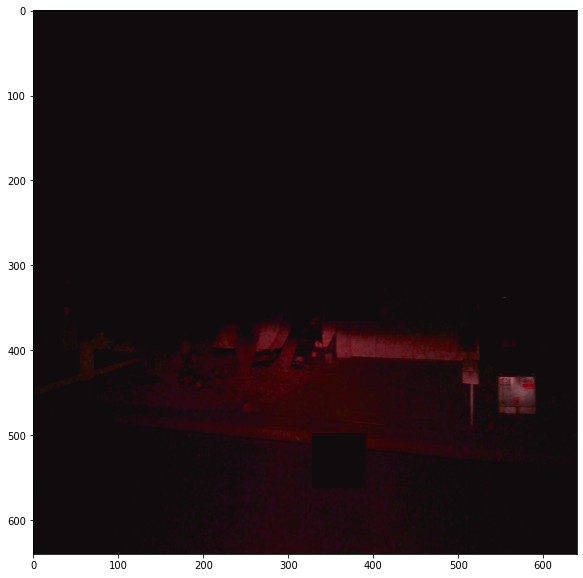

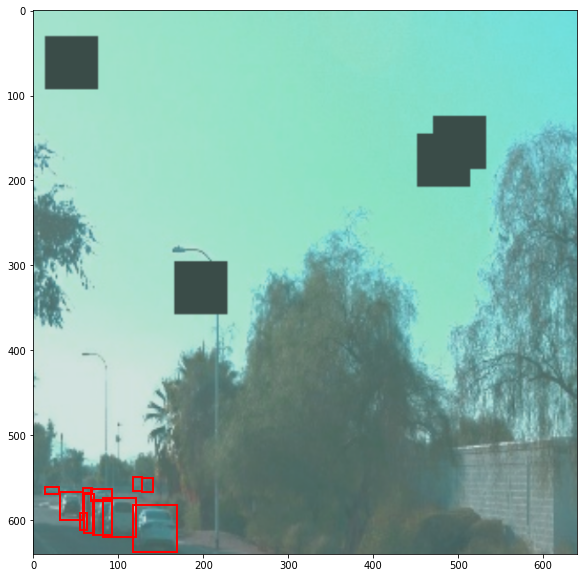

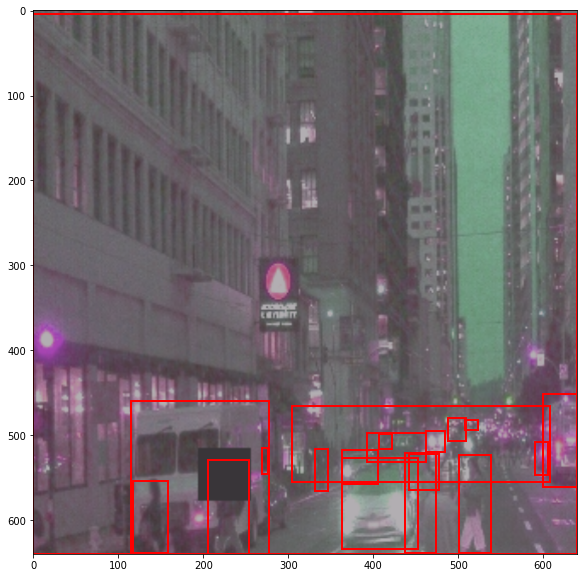

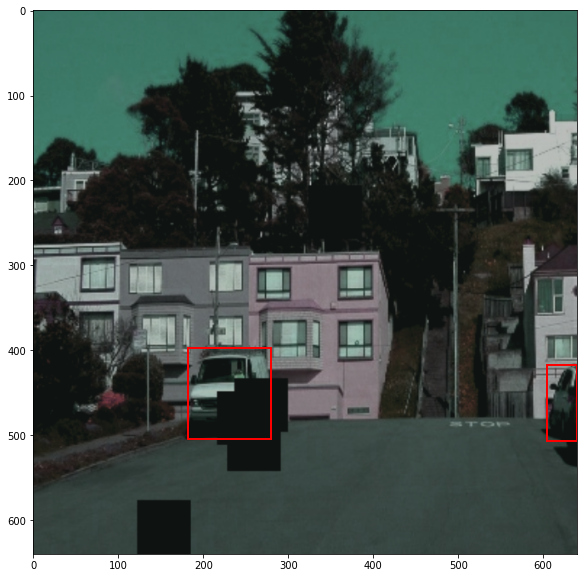

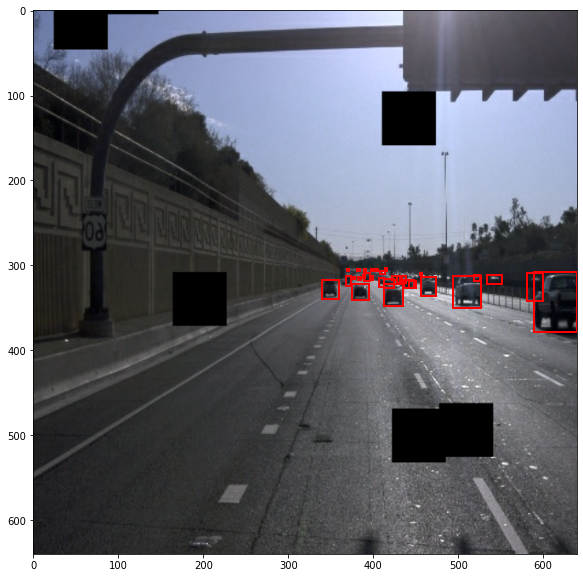

In [20]:
for batch in train_dataset.take(10):
    display_batch(batch)